In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from skimage.io import imread, imsave
from skimage.filters import gaussian
from skimage.registration import phase_cross_correlation
from skimage.transform import EuclideanTransform, warp

In [2]:
def map_func(p, edt, rs):
    rstep = np.mean(np.diff(rs))
    npos = p.shape[0]
    for i in range(npos):
        r,t = p[i,:].astype(int)
        p[i,0] = (edt[t,:,:].max() - rs[r]) / rstep
    return p

In [3]:
path_ext = '/media/guillermo/Expansion/Thesis GY/3. Analyzed files'
folder_results = 'results'
folder_velocity = 'velocity_data'

scopes = {'Tweez scope': 'TiTweez', 'Ti scope': 'Ti'}
dnas = {'pLPT20&pLPT41': 'pLPT20&41', 'pLPT119&pLPT41': 'pLPT119&41', 'pAAA': 'pAAA', 'pLPT107&pLPT41': 'pLPT107&41'}

In [43]:
exp_date = '2023_12_08'
#vector = 'pAAA'
vector = 'pLPT107&pLPT41'
#vector = 'pLPT20&pLPT41'
#vector = 'pLPT119&pLPT41'

scope_name = 'Ti scope'
pos = 21

path_scope = os.path.join(path_ext, scope_name)
path = os.path.join(path_scope, exp_date)
path_results = os.path.join(path,folder_results, f"pos{pos}")
path_velocity = os.path.join(path,folder_velocity, f"pos{pos}")

fname = f'{exp_date}_10x_1.0x_{dnas[vector]}_{scopes[scope_name]}_Pos{pos}.ome.tif'
fname

'2023_12_08_10x_1.0x_pLPT107&41_Ti_Pos21.ome.tif'

In [44]:
if vector == 'pLPT20&pLPT41' or vector == 'pLPT119&pLPT41':
    yfp_chn = 0
    cfp_chn = 1
    ph_chn = 2
    fluo_chns = 2
else:
    rfp_chn = 0
    yfp_chn = 1
    cfp_chn = 2
    ph_chn = 3
    fluo_chns = 3

#### Crop image

In [45]:
im_all = imread(os.path.join(path,fname))[:216,:,:,:]
nt,nx,ny,nc = im_all.shape
bg = np.zeros((nc,))
for c in range(nc):
    bg[c] = im_all[0,:100,:100,c].mean()

In [46]:
edt = np.load(os.path.join(path_results,'edt.npy'))[:216,:,:]
edt = edt[:,:,:]

In [8]:
## pad the image so it does not crop outside the image
edt = np.pad(edt, ((0,0),(256,256),(256,256)))
im_all = np.pad(im_all, ((0,0),(256,256),(256,256),(0,0)))
nt,nx,ny = edt.shape

In [47]:
y,x = np.meshgrid(np.arange(nx), np.arange(ny))
edt0 = edt[-1,:,:]
minx = x[edt0>0].min()
maxx = x[edt0>0].max()
miny = y[edt0>0].min()
maxy = y[edt0>0].max()
w = maxx - minx
w = int(w//2) * 2
h = maxy - miny
h = int(h//2) * 2

print(w,h)
pad = 32

crop_im_all = np.zeros((nt,w+2*pad,h+2*pad,nc))
crop_edt = np.zeros((nt,w+2*pad,h+2*pad))
print(crop_im_all.shape)
print(crop_edt.shape)

for t in range(nt):
    tedt = edt[t,:,:]
    cx = int(x[tedt>0].mean())
    cy = int(y[tedt>0].mean())
    cim = gaussian(im_all[t,cx - w//2 - pad:cx + w//2 + pad,cy - h//2 - pad:cy + h//2 + pad, :], 0.5)
    #cim = im_all[t,cx - w//2 - pad:cx + w//2 + pad,cy - h//2 - pad:cy + h//2 + pad, :]
    crop_im_all[t,:,:,:] = cim
    crop_edt[t,:,:] = tedt[cx - w//2 - pad:cx + w//2 + pad,cy - h//2 - pad:cy + h//2 + pad]

406 416
(216, 470, 480, 4)
(216, 470, 480)


In [31]:
## registration
for t in range(1,nt):
    shift,err,phase = phase_cross_correlation(crop_im_all[0,:,:,ph_chn].astype(float), crop_im_all[t,:,:,ph_chn].astype(float))
    tform = EuclideanTransform(translation=[shift[1],shift[0]])
    for c in range(nc):
        crop_im_all[t,:,:,c] = warp(crop_im_all[t,:,:,c].astype(float), tform.inverse, mode='reflect')
    crop_edt[t,:,:] = warp(crop_edt[t,:,:].astype(float), tform.inverse)

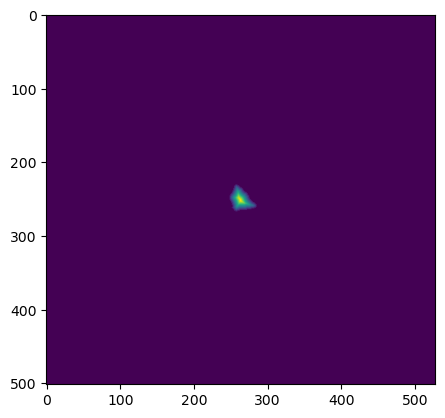

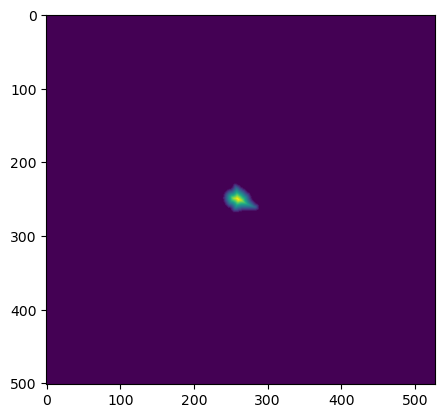

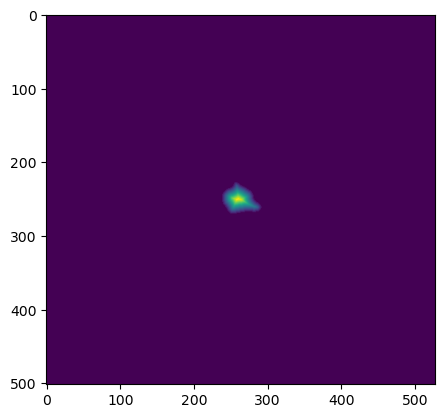

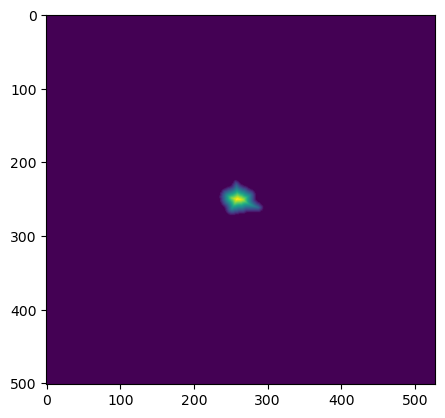

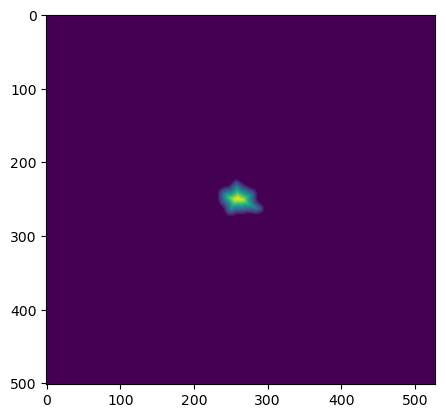

...

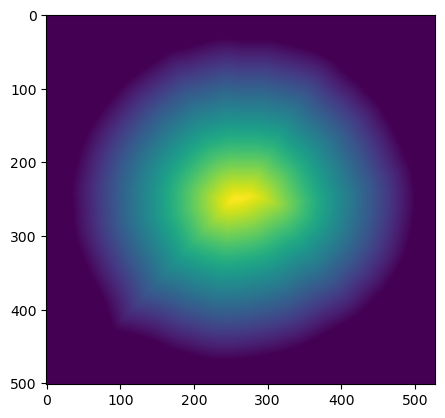

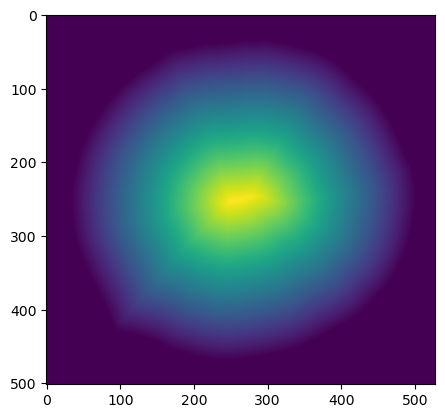

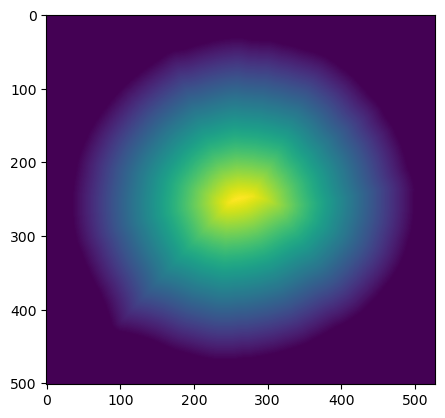

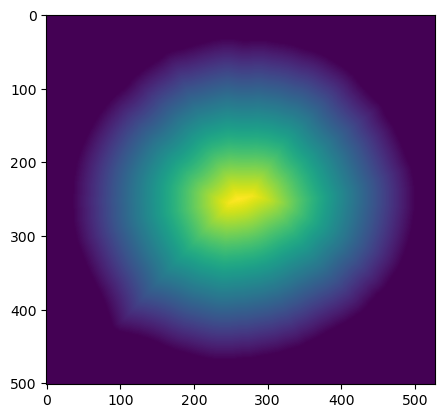

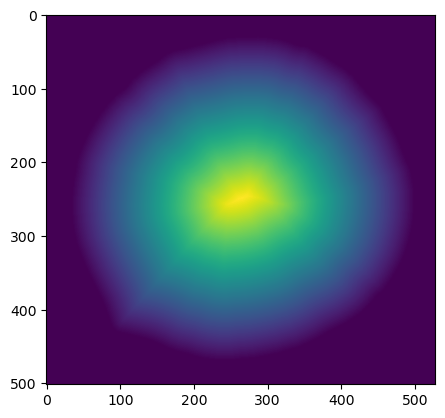

In [11]:
for i in range(0,nt):
    plt.imshow(crop_edt[i,:,:])
    plt.show()

In [12]:
#np.save(os.path.join(path_results,'crop_edt.npy'), crop_edt)

In [48]:
im_all = crop_im_all
edt = crop_edt
del crop_im_all
del crop_edt

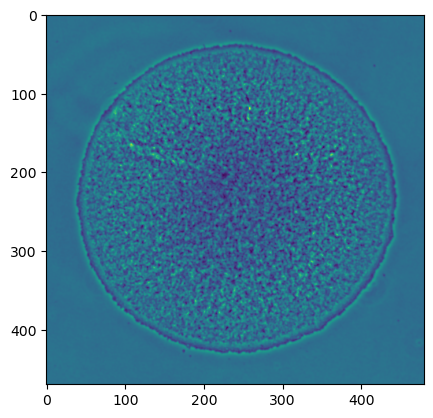

In [49]:
plt.imshow(im_all[-1,:,:,ph_chn])

#### Normalize image

In [50]:
nt,nx,ny,nc = im_all.shape

normed_im = np.zeros((nt,nx,ny,nc))
normed_im[:,:,:,ph_chn] = im_all[:,:,:,ph_chn]
for t in range(nt):
    tedt = edt[t,:,:]
    ## all but phase
    for c in range(nc-1):
        tcim = im_all[t,:,:,c]
        min_tcim = tcim[tedt>0].min()
        max_tcim = tcim[tedt>0].max()
        # Normalise fluo
        ntcim = (tcim - min_tcim) / (max_tcim - min_tcim)
        # Remove fluo from bg
        ntcim[tedt==0] = 0 # np.nan
        normed_im[t,:,:,c] = ntcim

In [51]:
#imsave(f'normed_{fname}', normed_im)

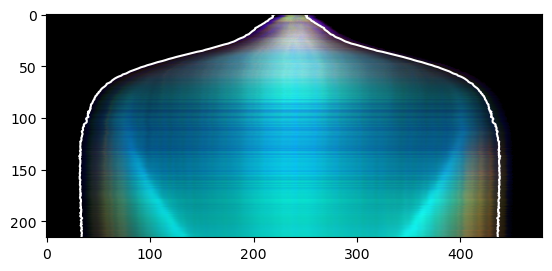

In [52]:
cx = nx // 2
cy = ny // 2
if fluo_chns == 2:
    normed_im_aux = np.zeros_like(normed_im)
    normed_im_aux[:,:,:,1] = normed_im[:,:,:,0]
    normed_im_aux[:,:,:,2] = normed_im[:,:,:,1]
    plt.imshow(normed_im_aux[:,cx-16:cx+16,:,:].mean(axis=1))
elif fluo_chns == 3:
    plt.imshow(normed_im[:,cx-16:cx+16,:,:ph_chn].mean(axis=1))

radius = edt.max(axis=(1,2))
plt.plot(cx + radius, np.arange(nt), 'w')
plt.plot(cx - radius, np.arange(nt), 'w')

In [53]:
fname

'2023_12_08_10x_1.0x_pLPT107&41_Ti_Pos21.ome.tif'

#### Normed kymo

In [54]:
df = pd.read_excel('../data_processed.xlsx')
df.head()

,Date,Machine,Position,Strain,DNA,Chemical,Pad,Dilution,t_incub,t_im,...,gomp_params,logistic_params,t_m_gomp,t_m_logistic,r0,wave_pos_coefs,wave_speed_av,rad_max,area_max_um,rad_max_um
0,2023-11-15,Ti scope,0,MC4100,pLPT20&pLPT41,-,1,10^(-5),09:25:00,14:41:00,...,"{""A"": 11.29467129374218, ""mu_m"": 0.03429671707...","{""A"": 11.291854811467543, ""mu_m"": 0.0253848483...",196.234198,225.219567,22.567534,[ 4.28881615e-09 -1.14403907e-06 1.17932253e-...,9.117994,160.398612,106182.5184,182.854418
1,2023-11-15,Ti scope,1,MC4100,pLPT20&pLPT41,-,1,10^(-5),09:25:00,14:41:00,...,"{""A"": 11.651550757675393, ""mu_m"": 0.0365208238...","{""A"": 11.649139256480966, ""mu_m"": 0.0268369079...",189.071440,215.629207,32.953934,[ 1.61900671e-09 -4.65177336e-07 5.07279382e-...,8.818193,192.998198,152582.1372,220.017946
2,2023-11-15,Ti scope,3,MC4100,pLPT20&pLPT41,-,1,10^(-5),09:25:00,14:41:00,...,"{""A"": 11.58037729284504, ""mu_m"": 0.03699178625...","{""A"": 11.578378488201757, ""mu_m"": 0.0270179440...",180.609065,205.356638,43.862215,[ 1.12971199e-09 -4.03357938e-07 5.59275580e-...,7.840974,185.582357,140972.8104,211.563887
3,2023-11-15,Ti scope,6,MC4100,pLPT20&pLPT41,-,1,10^(-5),09:25:00,14:41:00,...,"{""A"": 11.263179105925273, ""mu_m"": 0.0342345182...","{""A"": 11.261690794798985, ""mu_m"": 0.0247235365...",151.439181,174.692595,20.498910,[ 1.51592115e-09 -5.35988459e-07 7.39024159e-...,8.048190,158.601509,102700.8900,180.805721
4,2023-11-15,Ti scope,7,MC4100,pLPT20&pLPT41,-,1,10^(-5),09:25:00,14:41:00,...,"{""A"": 11.528274906804539, ""mu_m"": 0.0376935142...","{""A"": 11.526236072514887, ""mu_m"": 0.0275867338...",186.954076,211.573857,30.891799,[ 5.29691541e-12 -8.18086232e-09 3.27859257e-...,9.299032,179.352843,133640.4672,204.462241


In [55]:
nt,nx,ny,nc = im_all.shape
nr = 64
rw = 16
rs = np.linspace(rw, edt.max(), nr)
#kymo = np.zeros((nt,nr,3)) + np.nan
nkymo = np.zeros((nt,nr,nc-1)) + np.nan
for t in range(nt):
    for c in range(nc-1):
        for ri in range(nr):
            tedt = edt[t,:,:]
            idx = np.abs(tedt - rs[ri]) < rw
            if np.sum(idx)>0:
                #ntcim = im_all[t,:,:,1+c]
                #kymo[t,ri,c] = np.nanmean(ntcim[idx])
                ntcnim = normed_im[t,:,:,c]
                nkymo[t,ri,c] = np.nanmean(ntcnim[idx])
#np.save(os.path.join(path_results,'nkymo.npy'), nkymo)

In [56]:
wnkymo = np.zeros_like(nkymo)
for c in range(nc-1):
    wnkymo[:,:,c] = warp(nkymo[:,:,c], map_func, {'edt':edt, 'rs':rs})
wnkymo[np.isnan(nkymo)] = np.nan
#np.save(os.path.join(path_results,'wnkymo.npy'),wnkymo)

In [57]:
df = pd.read_excel('../data_processed.xlsx')
## preparing labels
df_pos = df[(df['Date'].dt.strftime('%Y_%m_%d') == exp_date) &
    (df.Machine == scope_name) &
    (df.DNA == vector) &
    (df.Position == pos)]
df_pos

,Date,Machine,Position,Strain,DNA,Chemical,Pad,Dilution,t_incub,t_im,...,gomp_params,logistic_params,t_m_gomp,t_m_logistic,r0,wave_pos_coefs,wave_speed_av,rad_max,area_max_um,rad_max_um
126,2023-12-08,Ti scope,21,MC4100,pLPT107&pLPT41,ATC+,3,10^(-5),14:18:00,20:30:00,...,"{""A"": 11.80091118632363, ""mu_m"": 0.01773371863...","{""A"": 11.794715713001677, ""mu_m"": 0.0136680081...",250.054024,324.197036,42.368558,[ 2.71801222e-11 -1.34689704e-08 2.53116183e-...,6.59071,200.547772,174633.75,228.624461


In [58]:
## time labels
incub = df_pos['incub_time'].values[0]
#exp_length = df_pos['exp length'].values[0]
time_points = np.arange(0, nt)*10 + incub
time_strings = [f"{int(tp // 60):02d}" for tp in time_points]  # Show only hours
interval = 30
indices = np.arange(0, len(time_points), interval)
selected_time_strings = [time_strings[i] for i in indices]

In [59]:
## distance labels
ylim = edt.max() * df_pos['um_px'].values[0]

In [60]:
edt_max = edt.max(axis=(1,2))

/home/guillermo/anaconda3/envs/popdyn/lib/python3.11/site-packages/matplotlib/cm.py:489: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


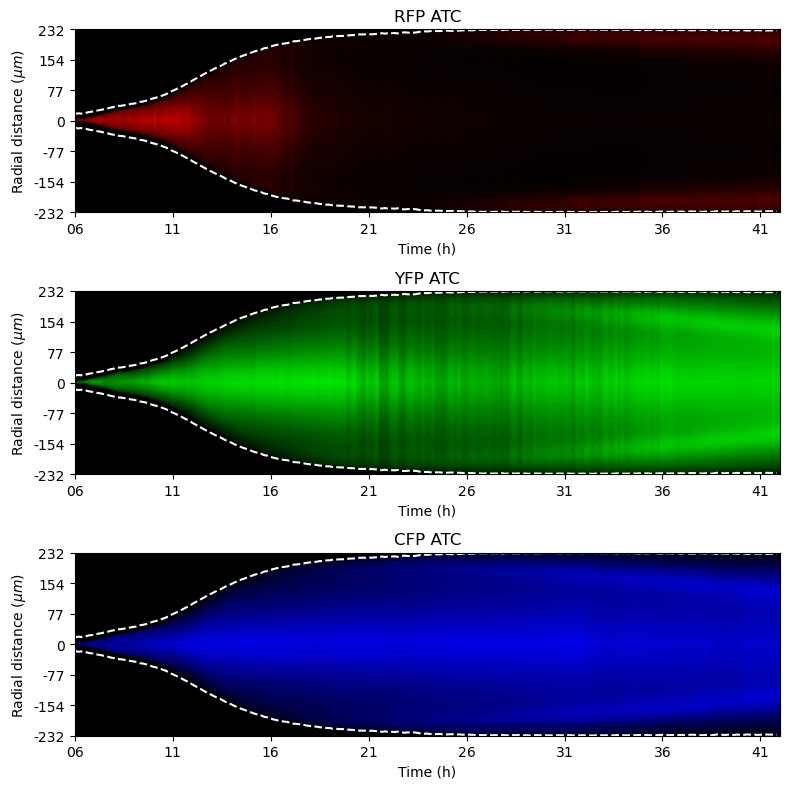

/home/guillermo/anaconda3/envs/popdyn/lib/python3.11/site-packages/matplotlib/cm.py:489: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


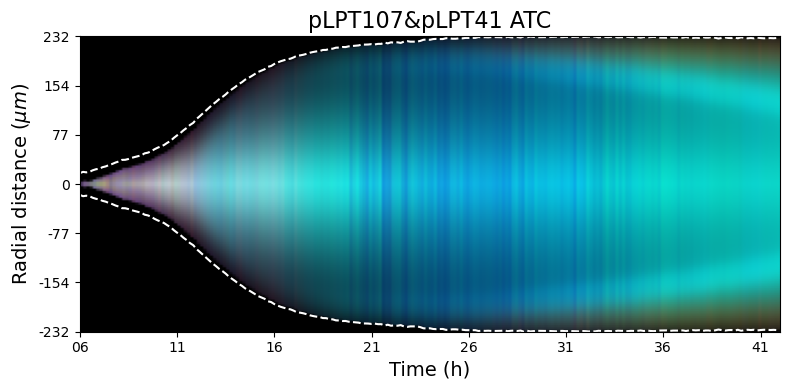

In [63]:
um_px = df_pos['um_px'].values[0]
if fluo_chns == 2:
    wnkymoy = np.zeros((nt,nr,nc))
    wnkymoc = np.zeros((nt,nr,nc))
    wnkymoy[:,:,1] = wnkymo[:,:,0]
    wnkymoc[:,:,2] = wnkymo[:,:,1]
    
    fig, axs = plt.subplots(2, 1, figsize=(6, 6))
    
    # Plot YFP
    axs[0].imshow(np.hstack([wnkymoy[:, ::-1, :], wnkymoy[:, :, :]]).transpose([1, 0, 2]), 
                  aspect='auto', 
                  extent=[0, nt, -ylim, ylim])
    axs[0].plot(um_px*edt_max, 'w--')
    axs[0].plot(-um_px*edt_max, 'w--')
    axs[0].set_xlabel('Time (h)')
    axs[0].set_ylabel('Radial distance ($\mu m)$')
    axs[0].set_title('YFP')
    axs[0].set_xticks(indices)
    axs[0].set_xticklabels(selected_time_strings)
    yticks = np.linspace(-ylim, ylim, num=7)
    axs[0].set_yticks(yticks)
    axs[0].set_yticklabels([f'{int(tick)}' for tick in yticks])
    
    # Plot CFP
    axs[1].imshow(np.hstack([wnkymoc[:, ::-1, :], wnkymoc[:, :, :]]).transpose([1, 0, 2]), 
                  aspect='auto', 
                  extent=[0, nt, -ylim, ylim])
    axs[1].plot(um_px*edt_max, 'w--')
    axs[1].plot(-um_px*edt_max, 'w--')
    axs[1].set_xlabel('Time (h)')
    axs[1].set_ylabel('Radial distance ($\mu m)$')
    axs[1].set_title('CFP')
    axs[1].set_xticks(indices)
    axs[1].set_xticklabels(selected_time_strings)
    yticks = np.linspace(-ylim, ylim, num=7)
    axs[1].set_yticks(yticks)
    axs[1].set_yticklabels([f'{int(tick)}' for tick in yticks])
    
    plt.tight_layout()
    plt.savefig(f'normed_kymo_{vector}_split.png', dpi=300, bbox_inches='tight', pad_inches=0)
    plt.show()

    ## Plot composite
    wnkymoc_aux = np.zeros((nt,nr,nc))
    wnkymoc_aux[:,:,1] = wnkymo[:,:,0]
    wnkymoc_aux[:,:,2] = wnkymo[:,:,1]
    plt.figure(figsize=((8,4)))
    plt.imshow(np.hstack([wnkymoc_aux[:,::-1,:],wnkymoc_aux[:,:,:]]).transpose([1,0,2]), 
               aspect='auto', 
               extent=[0,nt,-ylim,ylim])
    plt.plot(um_px*edt_max, 'w--')
    plt.plot(-um_px*edt_max, 'w--')
    plt.xlabel('Time (h)', fontsize=14)
    plt.ylabel('Radial distance ($\mu m)$', fontsize=14)
    plt.title(f'{vector}', fontsize=16)
    plt.xticks(ticks=indices, labels=selected_time_strings)
    yticks = np.linspace(-ylim, ylim, num=7)
    plt.yticks(ticks=yticks, labels=[f'{int(tick)}' for tick in yticks])
    
    plt.tight_layout()
    plt.savefig(f'normed_kymo_{vector}.png', dpi=300, bbox_inches='tight', pad_inches=0)
    plt.show()
    
elif fluo_chns == 3:# & vector != 'pAAA':
    wnkymor = np.zeros((nt,nr,nc-1))
    wnkymoy = np.zeros((nt,nr,nc-1))
    wnkymoc = np.zeros((nt,nr,nc-1))
    wnkymor[:,:,0] = wnkymo[:,:,0]    
    wnkymoy[:,:,1] = wnkymo[:,:,1]
    wnkymoc[:,:,2] = wnkymo[:,:,2]
    fig, axs = plt.subplots(3, 1, figsize=(8, 8))
    # Plot RFP
    axs[0].imshow(np.hstack([wnkymor[:, ::-1, :], wnkymor[:, :, :]]).transpose([1, 0, 2]), 
                  aspect='auto', 
                  extent=[0, nt, -ylim, ylim])
    axs[0].plot(um_px*edt_max, 'w--')
    axs[0].plot(-um_px*edt_max, 'w--')
    axs[0].set_xlabel('Time (h)')
    axs[0].set_ylabel('Radial distance ($\mu m)$')
    axs[0].set_title('RFP ATC')
    axs[0].set_xticks(indices)
    axs[0].set_xticklabels(selected_time_strings)
    yticks = np.linspace(-ylim, ylim, num=7)
    axs[0].set_yticks(yticks)
    axs[0].set_yticklabels([f'{int(tick)}' for tick in yticks])
    
    # Plot YFP
    axs[1].imshow(np.hstack([wnkymoy[:, ::-1, :], wnkymoy[:, :, :]]).transpose([1, 0, 2]), 
                  aspect='auto', 
                  extent=[0, nt, -ylim, ylim])
    axs[1].plot(um_px*edt_max, 'w--')
    axs[1].plot(-um_px*edt_max, 'w--')
    axs[1].set_xlabel('Time (h)')
    axs[1].set_ylabel('Radial distance ($\mu m)$')
    axs[1].set_title('YFP ATC')
    axs[1].set_xticks(indices)
    axs[1].set_xticklabels(selected_time_strings)
    yticks = np.linspace(-ylim, ylim, num=7)
    axs[1].set_yticks(yticks)
    axs[1].set_yticklabels([f'{int(tick)}' for tick in yticks])
    
    # Plot CFP
    axs[2].imshow(np.hstack([wnkymoc[:, ::-1, :], wnkymoc[:, :, :]]).transpose([1, 0, 2]), 
                  aspect='auto', 
                  extent=[0, nt, -ylim, ylim])
    axs[2].plot(um_px*edt_max, 'w--')
    axs[2].plot(-um_px*edt_max, 'w--')
    axs[2].set_xlabel('Time (h)')
    axs[2].set_ylabel('Radial distance ($\mu m)$')
    axs[2].set_title('CFP ATC')
    axs[2].set_xticks(indices)
    axs[2].set_xticklabels(selected_time_strings)
    yticks = np.linspace(-ylim, ylim, num=7)
    axs[2].set_yticks(yticks)
    axs[2].set_yticklabels([f'{int(tick)}' for tick in yticks])
    
    plt.tight_layout()
    plt.savefig(f'normed_kymo_{vector}_split_ATC.png', dpi=300, bbox_inches='tight', pad_inches=0)
    plt.show()

    ## Plot composite
    plt.figure(figsize=(8,4))
    plt.imshow(np.hstack([wnkymo[:,::-1,:],wnkymo[:,:,:]]).transpose([1,0,2]), 
               aspect='auto', 
               extent=[0,nt,-ylim,ylim])
    plt.plot(um_px*edt_max, 'w--')
    plt.plot(-um_px*edt_max, 'w--')
    plt.xlabel('Time (h)', fontsize=14)
    plt.ylabel('Radial distance ($\mu m)$', fontsize=14)
    plt.title(f'{vector} ATC', fontsize=16)
    plt.xticks(ticks=indices, labels=selected_time_strings)
    yticks = np.linspace(-ylim, ylim, num=7)
    plt.yticks(ticks=yticks, labels=[f'{int(tick)}' for tick in yticks])
    
    plt.tight_layout()
    plt.savefig(f'normed_kymo_{vector}_ATC.png', dpi=300, bbox_inches='tight', pad_inches=0)
    plt.show()


In [51]:
wnkymor.shape

(216, 64, 4)

/home/guillermo/anaconda3/envs/popdyn/lib/python3.11/site-packages/matplotlib/cm.py:489: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


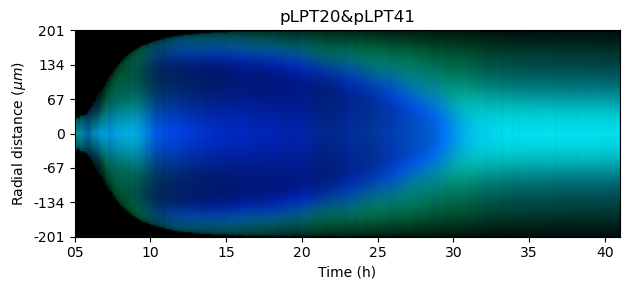

In [133]:
plt.figure(figsize=(12,3))
plt.subplot(1, 2, 1)
if fluo_chns == 2:
    wnkymo_aux = np.zeros((nt,nr,nc))
    wnkymo_aux[:,:,1] = wnkymo[:,:,0]
    wnkymo_aux[:,:,2] = wnkymo[:,:,1]
    plt.imshow(np.hstack([wnkymo_aux[:,::-1,:],wnkymo_aux[:,:,:]]).transpose([1,0,2]), 
               aspect='auto', 
               extent=[0,nt,-ylim,ylim])
elif fluo_chns == 3:
    plt.imshow(np.hstack([wnkymo[:,::-1,:],wnkymo[:,:,:]]).transpose([1,0,2]), 
               aspect='auto', 
               extent=[0,nt,-ylim,ylim])
plt.xlabel('Time (h)')
plt.ylabel('Radial distance ($\mu m)$')
plt.title(vector)
plt.xticks(ticks=indices, labels=selected_time_strings)
yticks = np.linspace(-ylim, ylim, num=7)  # Adjust num to include more yticks if needed
plt.yticks(ticks=yticks, labels=[f'{int(tick)}' for tick in yticks])
plt.tight_layout()
plt.savefig(f'normed_kymo_{vector}.png', dpi=300, bbox_inches='tight', pad_inches=0)
plt.show()